In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sb

In [2]:
df = pd.read_csv('./data.csv')

In [3]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [4]:
df.shape

(569, 33)

In [5]:
df.columns[0:32]

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [6]:
df.loc[:, df.columns != 'Unnamed: 32']

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [7]:
# delete id diagnosis
Y = df['diagnosis']
X = df.drop(['id', 'Unnamed: 32', 'diagnosis'], axis=1, inplace=False)

In [8]:
X

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [9]:
Y = Y.to_numpy().reshape(Y.shape[0], -1)
print(Y[:5])
print(Y.shape)

[['M']
 ['M']
 ['M']
 ['M']
 ['M']]
(569, 1)


In [10]:
X_trains, X_cross, Y_trains, Y_cross = train_test_split(X, Y, test_size=0.3, random_state=0)
print(X_trains.shape)
print(Y_trains.shape)
print(X_cross.shape)
print(Y_cross.shape)
print(X_trains)
print(Y_trains)

(398, 30)
(398, 1)
(171, 30)
(171, 1)
     radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
478       11.490         14.59           73.99      404.9          0.10460   
303       10.490         18.61           66.86      334.3          0.10680   
155       12.250         17.94           78.27      460.3          0.08654   
186       18.310         18.58          118.60     1041.0          0.08588   
101        6.981         13.43           43.79      143.5          0.11700   
..           ...           ...             ...        ...              ...   
277       18.810         19.98          120.90     1102.0          0.08923   
9         12.460         24.04           83.97      475.9          0.11860   
359        9.436         18.32           59.82      278.6          0.10090   
192        9.720         18.22           60.73      288.1          0.06950   
559       11.510         23.93           74.52      403.5          0.09261   

     compactness_mean  co

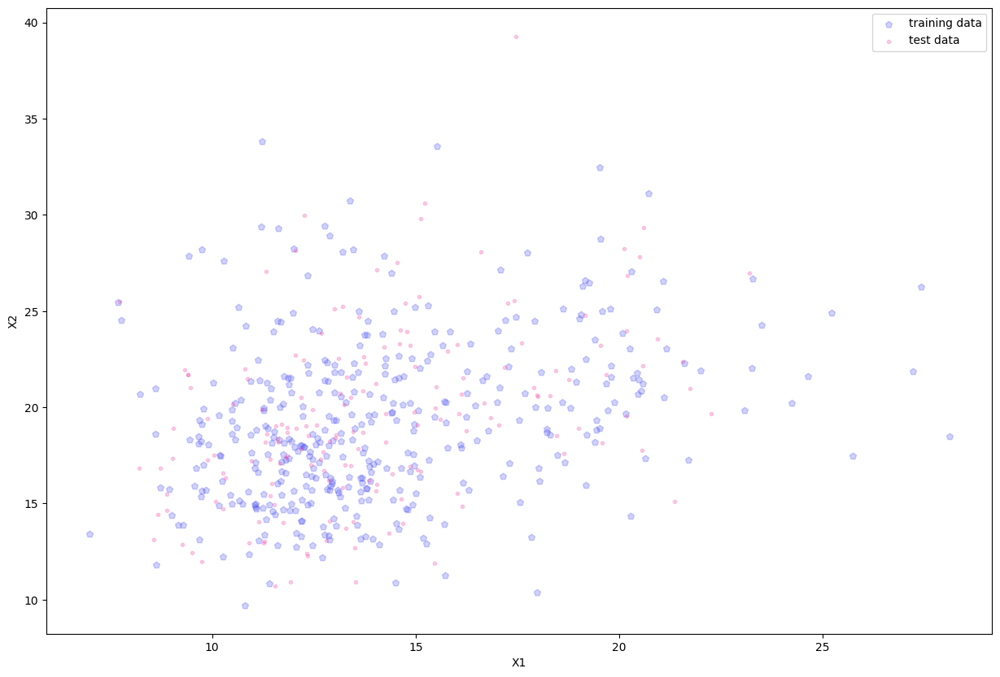

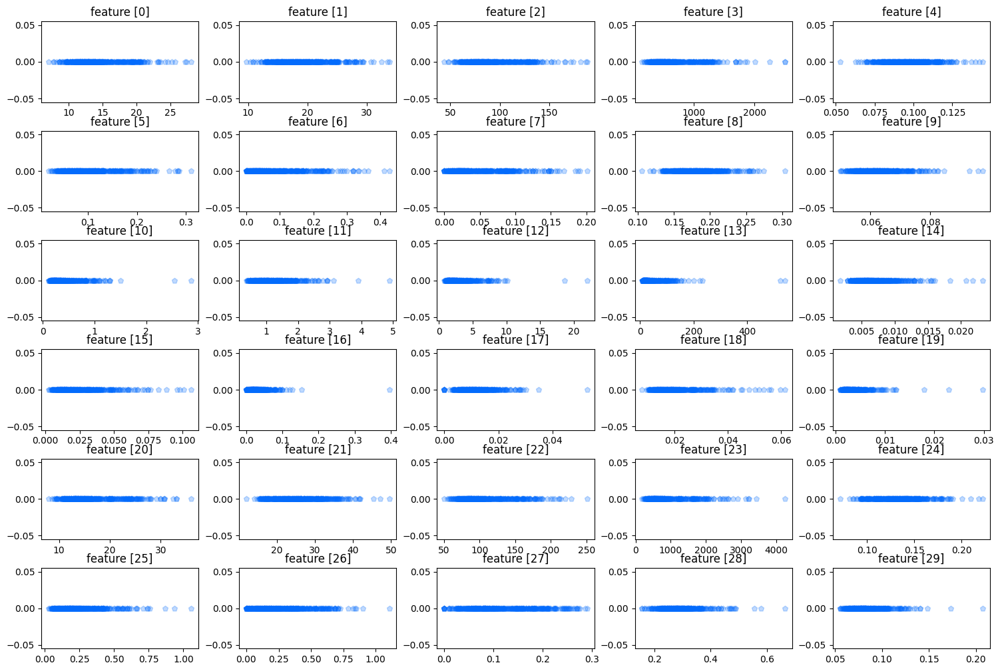

In [11]:
def plot_data(X_trains, X_tests):
    fig = plt.figure(figsize=(15, 10))
    axis = fig.add_subplot()

    axis.scatter(X_trains[:, 0], X_trains[:, 1], alpha=0.25, c='#4248f5', marker='p', label='training data')
    axis.scatter(X_tests[:, 0], X_tests[:, 1], alpha=0.25, c='#f542a1', marker='.', label='test data')
    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.legend()
    plt.show()

def analyze(X_trains, n_row_plots, m_col_plots):
    # sees the range where each feature lies
    fig, axes = plt.subplots(n_row_plots, m_col_plots, figsize=(15, 10))
    fig.tight_layout(pad=1)

    # no. of instances and features
    num_instances = X_trains.shape[0]
    num_features = X_trains.shape[1]

    # feature names
    # feature_names = list(range(num_features))
    
    zeros = np.zeros((num_instances,))
    
    # how do I keep the title without it being removed after plt.show()
    for feature_col_i, axis in enumerate(axes.flat):
        # print(feature_col_i)
        curr_feature = X_trains[:, feature_col_i].reshape(-1)
        # print(curr_feature)
        # print(curr_feature.shape)
        axis.scatter(curr_feature, zeros, alpha=0.25, marker='p', c='#036bfc')
        # print(feature_names[feature_col_i])
        
        # if feature_col_i % 8 == 0:
        #     axis.set_title(feature_names[feature_col_i])
        axis.set_title(f"feature [{feature_col_i}]")
        
    plt.show()

plot_data(X_trains.to_numpy(), X_cross.to_numpy())
analyze(X_trains.to_numpy(), 6, 5)

In [12]:
sb.set_palette('magma')
sb.pairplot(X_trains, )
plt.show()

## Insights:
* distributions of some features are skewed 

# Normalization
* features 1, 2, 3, 12, 13, 18, 17, 25, 26, 27, 28 need normalization


In [13]:
scaler = StandardScaler()
X_trains_normed = scaler.fit_transform(X_trains)
X_cross_normed = scaler.transform(X_cross)

X_trains_normed

array([[-0.74998027, -1.09978744, -0.74158608, ..., -0.6235968 ,
         0.07754241,  0.45062841],
       [-1.02821446, -0.1392617 , -1.02980434, ..., -0.7612376 ,
        -1.07145262, -0.29541379],
       [-0.53852228, -0.29934933, -0.56857428, ..., -0.50470441,
         0.34900827, -0.13371556],
       ...,
       [-1.3214733 , -0.20855336, -1.3143845 , ..., -0.98621857,
        -0.69108476, -0.13148524],
       [-1.24245479, -0.23244704, -1.27759928, ..., -1.7562754 ,
        -1.55125275, -1.01078909],
       [-0.74441558,  1.13188181, -0.72016173, ..., -0.28490593,
        -1.2308599 ,  0.20083251]])

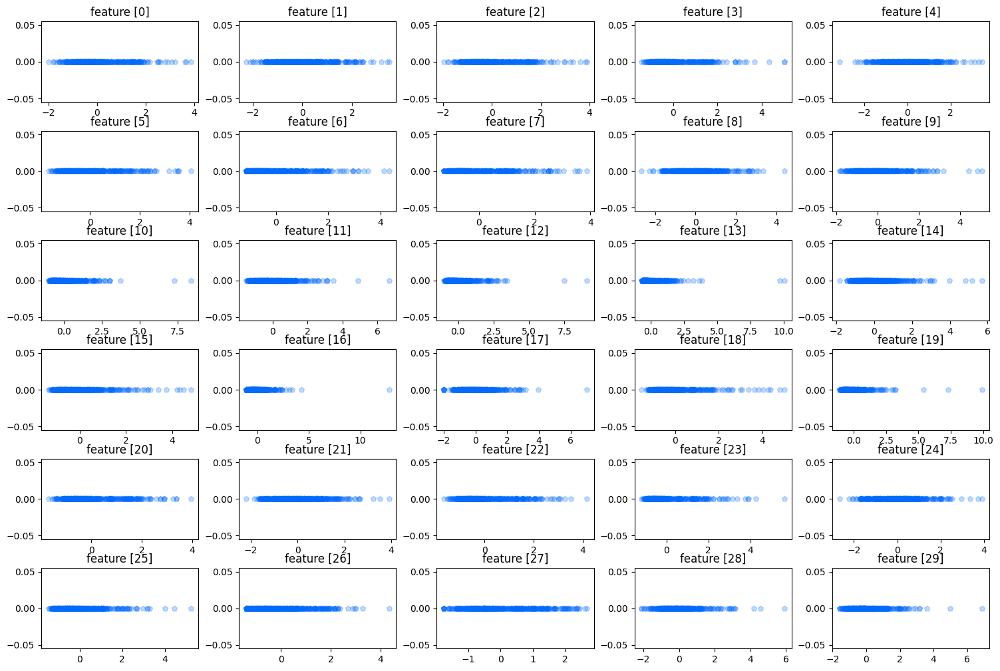

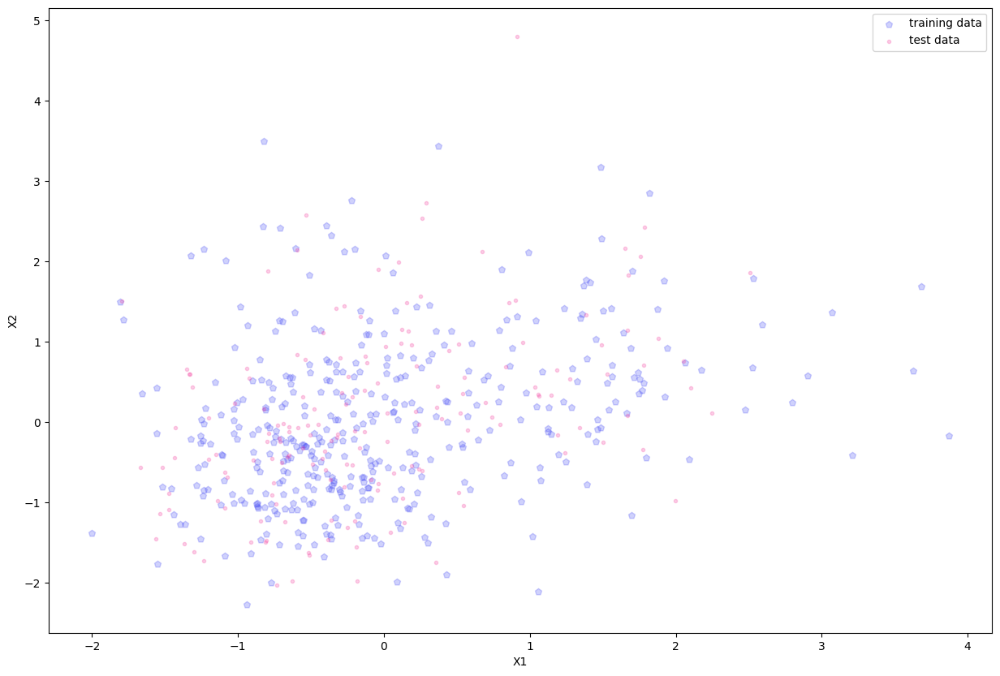

In [14]:
analyze(X_trains_normed, 6, 5)
plot_data(X_trains_normed, X_cross_normed)

## See the correlation between features

In [15]:
df_train = pd.DataFrame(X_trains_normed)
df_cross = pd.DataFrame(X_cross_normed)

df_train.corr()

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,1.000000,0.295249,0.998198,0.986838,0.173862,0.514335,0.691099,0.825141,0.130055,-0.334691,...,0.968661,0.261985,0.965167,0.940438,0.124559,0.410200,0.545764,0.739982,0.148186,-0.003661
1,0.295249,1.000000,0.301988,0.297965,-0.019339,0.227062,0.293874,0.278706,0.072918,-0.081656,...,0.330626,0.908330,0.336144,0.330487,0.098100,0.262653,0.301430,0.274823,0.094799,0.110480
2,0.998198,0.301988,1.000000,0.986457,0.207606,0.560260,0.726532,0.851581,0.162203,-0.290120,...,0.968600,0.269238,0.969497,0.941052,0.154020,0.448652,0.579350,0.765648,0.170639,0.035775
3,0.986838,0.297965,0.986457,1.000000,0.179881,0.504877,0.699187,0.823800,0.130645,-0.305238,...,0.960038,0.256899,0.957628,0.957294,0.126771,0.384823,0.526975,0.713896,0.122938,-0.008668
4,0.173862,-0.019339,0.207606,0.179881,1.000000,0.657633,0.523092,0.547595,0.524757,0.577168,...,0.210894,0.048346,0.232888,0.203238,0.804715,0.472693,0.446719,0.501396,0.390637,0.500584
5,0.514335,0.227062,0.560260,0.504877,0.657633,1.000000,0.882086,0.839100,0.593590,0.530379,...,0.543543,0.244771,0.590145,0.515566,0.591149,0.866026,0.832798,0.829554,0.512781,0.677353
6,0.691099,0.293874,0.726532,0.699187,0.523092,0.882086,1.000000,0.929651,0.487250,0.305407,...,0.697692,0.294430,0.731906,0.684334,0.461758,0.733864,0.880082,0.860910,0.391928,0.491046
7,0.825141,0.278706,0.851581,0.823800,0.547595,0.839100,0.929651,1.000000,0.445337,0.142726,...,0.829749,0.283116,0.852753,0.807316,0.456557,0.665314,0.770467,0.907160,0.371893,0.359519
8,0.130055,0.072918,0.162203,0.130645,0.524757,0.593590,0.487250,0.445337,1.000000,0.465672,...,0.161643,0.083067,0.190340,0.151767,0.409629,0.461318,0.425195,0.421450,0.701085,0.432600
9,-0.334691,-0.081656,-0.290120,-0.305238,0.577168,0.530379,0.305407,0.142726,0.465672,1.000000,...,-0.280000,-0.041873,-0.239676,-0.258208,0.531849,0.443050,0.327967,0.161519,0.340958,0.766143
